A model was trained for a specific purpose. At the end of a training process, it is common to see the predictive accuracy on the validation data beginning stagnating or decreasing. However, the one on the training data is still increasing. This phenomenon is called overfitting, Overfitting means the model beginning to learn the particular patterns on the training data but not generalized to the validation data. (More specifically, data not seen before). 

The opposite of overfitting is underfitting. It means the model is still improvable. The reasons could be not enough time for training, training the model in the wrong way, etc. The model can't learn the generalized patterns.

In the more correct way, you have to collect almost all types of data for the training. In statistics, you have to collect the representing data enough, not a small subset of the targeted population. However, collecting data itself is a problem, it is sometimes hard to collect all types of data. Here you are going to introduce a skill called `regularization` to help you train on a subset of data. 

Reference:
* Overfit and Underfit: https://www.tensorflow.org/tutorials/keras/overfit_and_underfit

In [0]:
!pip install -q --upgrade grpcio
!pip install -q tensorflow-gpu==2.0.0
!pip install -q git+https://github.com/tensorflow/docs

In [0]:
import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
import tensorflow_docs.plots
import matplotlib.pyplot as plt
import numpy as np
import pathlib
import shutil
import tempfile

print("Tensorflow Version: {}".format(tf.__version__))
print("Eager Mode: {}".format(tf.executing_eagerly()))
print("GPU {} available".format("is" if tf.config.experimental.list_physical_devices("GPU") else "not"))

Tensorflow Version: 2.0.0
Eager Mode: True
GPU is available


In [0]:
logdir = pathlib.Path(tempfile.mkdtemp())/"tensorboards_logs"
print(logdir)
shutil.rmtree(logdir, ignore_errors=True)

/tmp/tmp6rva297_/tensorboards_logs


## Data Preparation

Here you are going to explore the Higgs Dataset.

In [0]:
gz = tf.keras.utils.get_file('HIGGS.csv.gz', 'https://archive.ics.uci.edu/ml/machine-learning-databases/00280/HIGGS.csv.gz')

2816409600/2816407858 [==============================] - 125s 0us/step


In [0]:
FEATURES = 28

The `tf.data` APIs help you to load a CSV file in a compressed format without decompressed first.

In [0]:
ds = tf.data.experimental.CsvDataset(gz, [float(),]*(FEATURES+1), compression_type='GZIP')

In [0]:
type(ds), ds

(tensorflow.python.data.experimental.ops.readers.CsvDatasetV2,
 <CsvDatasetV2 shapes: ((), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), (), ()), types: (tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32, tf.float32)>)

You can simply define a mapping function for unpacking the CSV file in rows.

In [0]:
def pack_row(*row):
  label = row[0]
  features = tf.stack(row[1:], 1)
  return features, label

The method `unbatch()` helps to separate the batch data into a single piece of it.

In [0]:
packed_ds = ds.batch(10000).map(pack_row).unbatch()

Let's have a look at the dataset.

tf.Tensor(
[ 0.8692932  -0.6350818   0.22569026  0.32747006 -0.6899932   0.75420225
 -0.24857314 -1.0920639   0.          1.3749921  -0.6536742   0.9303491
  1.1074361   1.1389043  -1.5781983  -1.0469854   0.          0.65792954
 -0.01045457 -0.04576717  3.1019614   1.35376     0.9795631   0.97807616
  0.92000484  0.72165745  0.98875093  0.87667835], shape=(28,), dtype=float32)


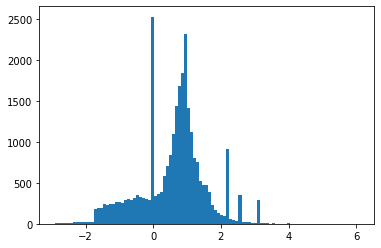

In [0]:
for features, labels in packed_ds.batch(1000).take(1):
  print(features[0])
  plt.hist(features.numpy().flatten(), bins=101)

In [0]:
N_VALIDATION = int(1e3)
N_TRAIN = int(1e4)
BUFFER_SIZE = int(1e4)
BATCH_SIZE = 500
STEPS_PER_EPOCH = N_TRAIN // BATCH_SIZE

The method `take()` gets the batch of data in the way of fetching a single piece of it. The method `skip()` helps to skip the amount of data. The method `cache()` helps to keep the data in the memory without reimporting it. 

In [0]:
validate_ds = packed_ds.take(N_VALIDATION).cache()
train_ds = packed_ds.skip(N_VALIDATION).take(N_TRAIN).cache()

In [0]:
train_ds

<CacheDataset shapes: ((28,), ()), types: (tf.float32, tf.float32)>

The batch provider of the training dataset first shuffles the amount of batch data. When the data pointer reaches the end of the dataset it comes to the head of data via `repeat()`.

In [0]:
validate_ds = validate_ds.batch(BATCH_SIZE)
train_ds = train_ds.shuffle(BUFFER_SIZE).repeat().batch(BATCH_SIZE)

# Demo Overfitting

## Decaying the Learning Rate

In [0]:
lr_schedule = tf.keras.optimizers.schedules.InverseTimeDecay(
    0.001,
    decay_steps = STEPS_PER_EPOCH * 1000,
    decay_rate = 1
)

def get_optimizer():
  return tf.keras.optimizers.Adam(lr_schedule)

In [0]:
type(lr_schedule)

tensorflow.python.keras.optimizer_v2.learning_rate_schedule.InverseTimeDecay

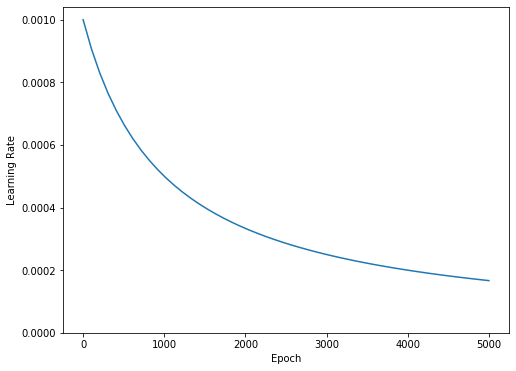

In [0]:
step = np.linspace(0, 1e5)
lr = lr_schedule(step)
plt.figure(figsize=(8,6))
plt.plot(step/STEPS_PER_EPOCH, lr)
plt.ylim([0, max(plt.ylim())])
plt.xlabel("Epoch")
_ = plt.ylabel('Learning Rate')

In [0]:
def get_callbacks(name):
  return [
          tfdocs.modeling.EpochDots(),
          tf.keras.callbacks.EarlyStopping(monitor='val_binary_crossentropy', patience=200),
          tf.keras.callbacks.TensorBoard(logdir/name),
  ]

In [0]:
def compile_and_fit(model, name, optimizer=None, max_epochs=10000):
  if optimizer is None:
    optimizer = get_optimizer()
  model.compile(optimizer=optimizer, 
                loss='binary_crossentropy', 
                metrics=['accuracy', 'binary_crossentropy'])
  model.summary()

  hist = model.fit(train_ds, 
                   steps_per_epoch=STEPS_PER_EPOCH, 
                   epochs=max_epochs, 
                   validation_data = validate_ds,
                   callbacks=get_callbacks(name),
                   verbose=0)
  return hist

## Tiny Model

In [0]:
def build_tiny_model(inputs):
  x = tf.keras.layers.Dense(16, activation='relu', input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
  return x

In [0]:
inputs = tf.keras.Input(shape=(28))
outputs = build_tiny_model(inputs)
tiny_model = tf.keras.Model(inputs, outputs)

In [0]:
size_histories = {}

In [0]:
size_histories["Tiny"] = compile_and_fit(tiny_model, 'sizes/Tiny')

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense (Dense)                (None, 16)                464       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 17        
Total params: 481
Trainable params: 481
Non-trainable params: 0
_________________________________________________________________

Epoch: 0, accuracy:0.5249,  binary_crossentropy:0.7263,  loss:0.7263,  val_accuracy:0.5160,  val_binary_crossentropy:0.7211,  val_loss:0.7211,  
....................................................................................................
Epoch: 100, accuracy:0.6509,  binary_crossentropy:0.6223,  loss:0.6223,  val_accuracy:0.6270,  val_binary_crossentropy:0.6348,  val_loss:0.6348,  

(0.5, 0.7)

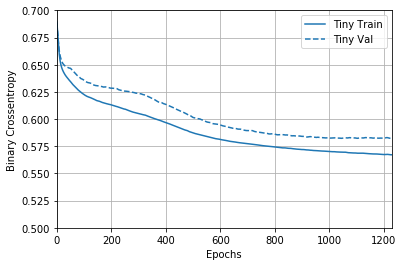

In [0]:
plotter = tfdocs.plots.HistoryPlotter(metric='binary_crossentropy', smoothing_std=10)
plotter.plot(size_histories)
plt.ylim([0.5, 0.7])

## Small Model

In [0]:
def build_small_model(inputs):
  x = tf.keras.layers.Dense(16, activation='relu', input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dense(16, activation='relu')(x)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
  return x

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_small_model(inputs)
small_model = tf.keras.Model(inputs, outputs)
small_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_2 (Dense)              (None, 16)                464       
_________________________________________________________________
dense_3 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 17        
Total params: 753
Trainable params: 753
Non-trainable params: 0
_________________________________________________________________


In [0]:
size_histories["Small"] = compile_and_fit(small_model, "sizes/Small")

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_2 (Dense)              (None, 16)                464       
_________________________________________________________________
dense_3 (Dense)              (None, 16)                272       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 17        
Total params: 753
Trainable params: 753
Non-trainable params: 0
_________________________________________________________________

Epoch: 0, accuracy:0.5005,  binary_crossentropy:0.7088,  loss:0.7088,  val_accuracy:0.4870,  val_binary_crossentropy:0.7035,  val_loss:0.7035,  
....................................................................................................
Epoch: 100, 

## Medium Model

In [0]:
def build_medium_model(inputs):
  x = tf.keras.layers.Dense(64, activation='relu', input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dense(64)(x)
  x = tf.keras.layers.Dense(64)(x)
  x = tf.keras.layers.Dense(1)(x)
  return x

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_medium_model(inputs)
medium_model = tf.keras.Model(inputs, outputs)
medium_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                1856      
_________________________________________________________________
dense_6 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_7 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 10,241
Trainable params: 10,241
Non-trainable params: 0
_________________________________________________________________


In [0]:
size_histories["Medium"] = compile_and_fit(medium_model, "sizes/Medium")

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                1856      
_________________________________________________________________
dense_6 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_7 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 10,241
Trainable params: 10,241
Non-trainable params: 0
_________________________________________________________________

Epoch: 0, accuracy:0.5188,  binary_crossentropy:5.2584,  loss:5.2584,  val_accuracy:0.5370,  val_binary_crossentropy:6.3

## Large Model

In [0]:
def build_large_model(inputs):
  x = tf.keras.layers.Dense(512, activation='relu', input_shape=(FEATURES, ))(inputs)
  x = tf.keras.layers.Dense(512, activation='relu')(x)
  x = tf.keras.layers.Dense(512, activation='relu')(x)
  x = tf.keras.layers.Dense(512, activation='relu')(x)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
  return x

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_large_model(inputs)
large_model = tf.keras.Model(inputs, outputs)
large_model.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               14848     
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_12 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 513       
Total params: 803,329
Trainable params: 803,329
Non-trainable params: 0
_____________________________________________________

In [0]:
size_histories["Large"] = compile_and_fit(large_model, "sizes/large")

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               14848     
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_12 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 513       
Total params: 803,329
Trainable params: 803,329
Non-trainable params: 0
_____________________________________________________

## View the training and validation losses

Text(0.5, 0, 'Epoch [Log Scale]')

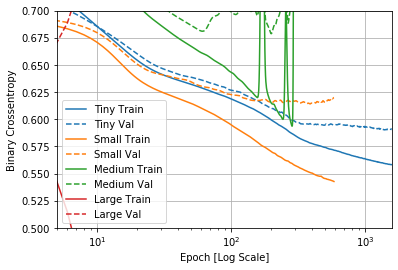

In [0]:
plotter.plot(size_histories)
a = plt.xscale('log')
plt.xlim([5, max(plt.xlim())])
plt.ylim([0.5, 0.7])
plt.xlabel("Epoch [Log Scale]")

It is clear that only the tiny model is not overfitting, the rest of the models are overfitting. The larger model seems to be powerful for conserving more weights to `mapping` the input data to the output labels. But this powerful attribute easily causes the overfitting. On the contrary, the small size of a model although is hard to get better performance or result while prediction and is relatively hard to overfit comparing to the bigger one. 

## View the Result in Tensorboard

In [0]:
%reload_ext tensorboard
%tensorboard --logdir {logdir}/sizes

# Strategies to Prevent Overfitting

In [0]:
shutil.rmtree(logdir/'regularizers/Tiny', ignore_errors=True)
shutil.copytree(logdir/'sizes/Tiny', logdir/'regularizers/Tiny')

PosixPath('/tmp/tmp6rva297_/tensorboards_logs/regularizers/Tiny')

In [0]:
regularizer_histories = {}
regularizer_histories["Tiny"] = size_histories["Tiny"] 

## Add Weight Regularization

The coefficient value 0.001 in l2() means the weight matrix of the layer will add `0.001 * weight_coefficient_value ** 2.0` to the total loss of the network.

In [0]:
def build_l2_model(inputs):
  x = tf.keras.layers.Dense(512, activation='elu', 
                            kernel_regularizer=tf.keras.regularizers.l2(0.001),
                            input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dense(512, activation='elu',
                            kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
  x = tf.keras.layers.Dense(512, activation='elu',
                            kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
  x = tf.keras.layers.Dense(512, activation='elu',
                            kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)    
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
  return x                         

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_l2_model(inputs)
l2_model = tf.keras.Model(inputs, outputs)

In [0]:
regularizer_histories["l2"] = compile_and_fit(l2_model, "regularizers/l2")

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               14848     
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_12 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 513       
Total params: 803,329
Trainable params: 803,329
Non-trainable params: 0
_____________________________________________________

(0.5, 0.7)

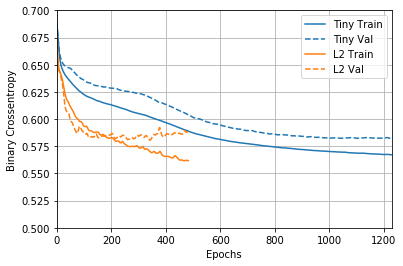

In [0]:
plotter.plot(regularizer_histories)
plt.ylim([0.5, 0.7])

## Add Dropout

In [0]:
def build_dropout_model(inputs):
  x = tf.keras.layers.Dense(512, activation='elu', input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu')(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu')(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu')(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)    
  return x

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_dropout_model(inputs)
dropout_model = tf.keras.Model(inputs, outputs)

In [0]:
regularizer_histories["dropout"] = compile_and_fit(l2_model, "regularizers/droput")

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_9 (Dense)              (None, 512)               14848     
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_12 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 513       
Total params: 803,329
Trainable params: 803,329
Non-trainable params: 0
_____________________________________________________

(0.5, 0.7)

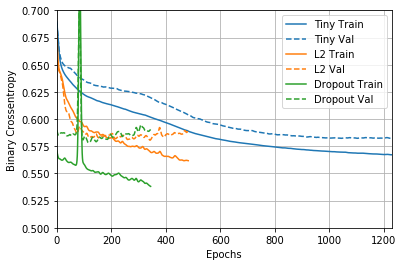

In [0]:
plotter.plot(regularizer_histories)
plt.ylim([0.5, 0.7])

## Combined L2 + Droput

In [0]:
def build_combined_model(inputs):
  x = tf.keras.layers.Dense(512, activation='elu', 
                            kernel_regularizer=tf.keras.regularizers.l2(0.0001), 
                            input_shape=(FEATURES,))(inputs)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu', 
                            kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu', 
                            kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(512, activation='elu', 
                            kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
  x = tf.keras.layers.Dropout(0.5)(x)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)    
  return x

In [0]:
inputs = tf.keras.Input(shape=(FEATURES))
outputs = build_combined_model(inputs)
combined_model = tf.keras.Model(inputs, outputs)

In [0]:
regularizer_histories["combined"] = compile_and_fit(combined_model, "regularizers/combined")

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 28)]              0         
_________________________________________________________________
dense_19 (Dense)             (None, 512)               14848     
_________________________________________________________________
dropout_9 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_20 (Dense)             (None, 512)               262656    
_________________________________________________________________
dropout_10 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               262656    
_________________________________________________________________
dropout_11 (Dropout)         (None, 512)               0   

(0.5, 0.7)

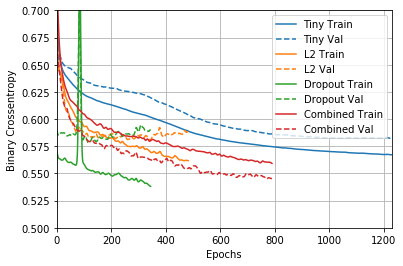

In [0]:
plotter.plot(regularizer_histories)
plt.ylim([0.5, 0.7])

## View the Result via Tensorboard

In [0]:
%reload_ext tensorboard
%tensorboard --logdir {logdir}/'regularizers'

Reusing TensorBoard on port 6006 (pid 3440), started 0:01:53 ago. (Use '!kill 3440' to kill it.)

From the above experiment, the way of combining both regularizer and dropout out-performs the rest of the models at reducing overfitting.

# Summary

There are several ways to reduce overfitting in the neural networks.
* Collect more data for enough representations.
* reduce the capacity of the model.
* Add the regularization to penal weights.
* Add the dropout layer.
* Add the batch normalization layer.
* Data augmentation.

Combined the above several ways, like combining both regularization and dropout.